## Module 6 Practice - Maps and Overlaying Spatial Data


In this notebook, we will see examples of how to obtain map images and visualize data as layers on them using ggplot and Google maps. 

Take a look at the [ggmap reference](https://journal.r-project.org/archive/2013-1/kahle-wickham.pdf).

In [3]:
library(ggplot2)
library(ggmap)
library(maps)
library(maptools)
library(RgoogleMaps)
library(sp)

Loading required package: sp
Checking rgeos availability: TRUE


There are different ways of getting map images and display them in R. We will start with **qmap**; it is an easy mapping tool using ggmap library. 

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=65201&zoom=14&size=640x640&scale=2&maptype=terrain&language=en-EN&sensor=false
Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=65201&sensor=false
Warning message:
“`panel.margin` is deprecated. Please use `panel.spacing` property instead”

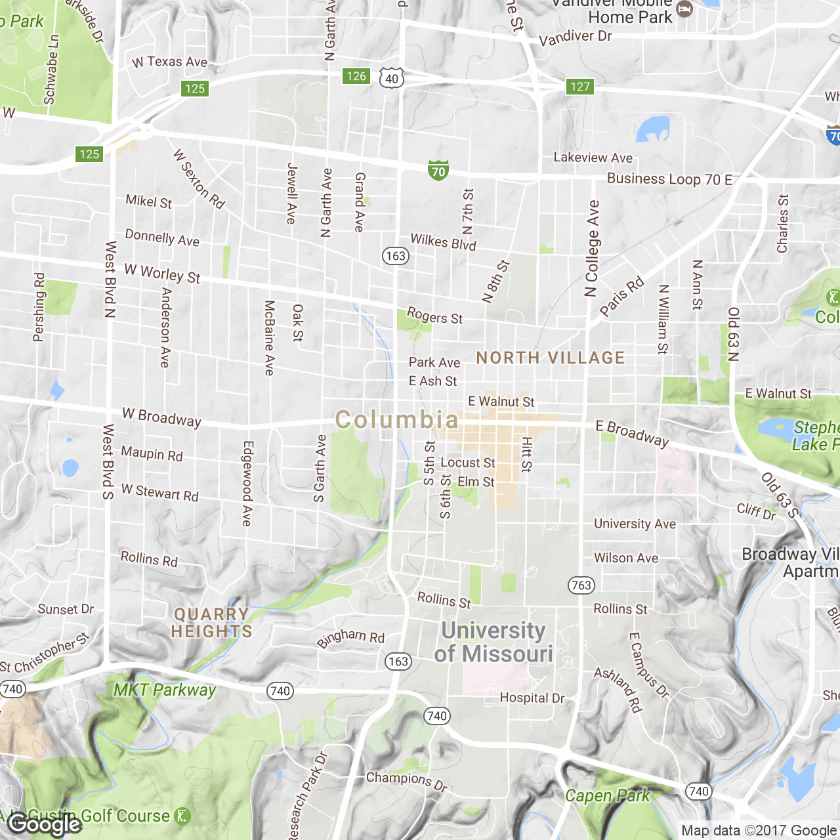

In [4]:
# get a map of Columbia, MO postal code 65201
qmap('65201', zoom = 14)

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=65201&zoom=14&size=640x640&scale=2&maptype=satellite&language=en-EN&sensor=false
Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=65201&sensor=false
Warning message:
“`panel.margin` is deprecated. Please use `panel.spacing` property instead”

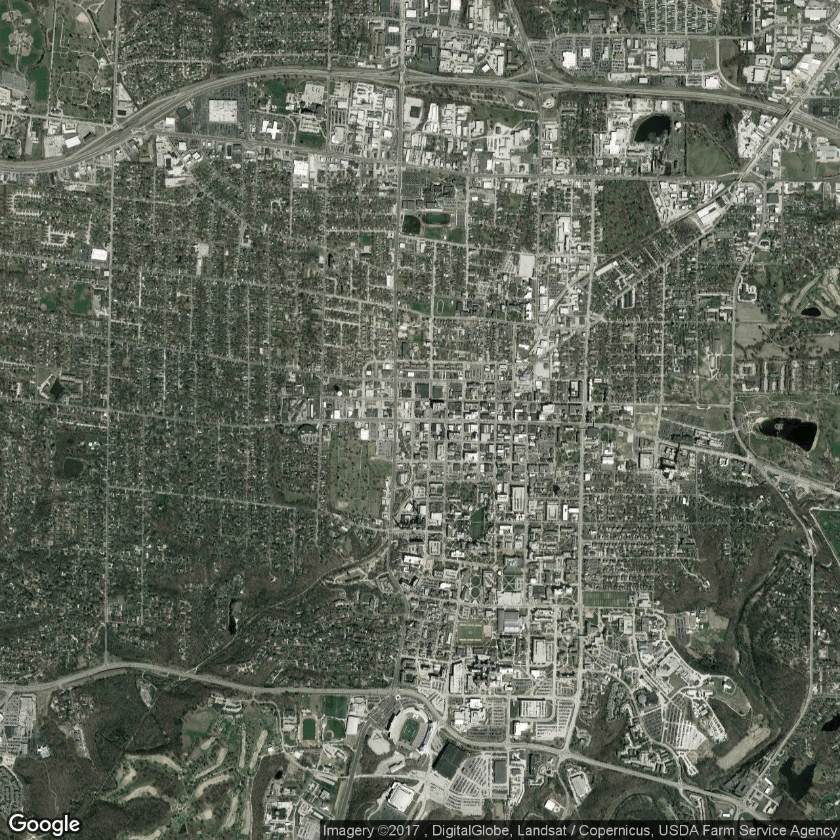

In [5]:
qmap('65201', zoom = 14, maptype = 'satellite')

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=65201&zoom=14&size=640x640&scale=2&maptype=hybrid&language=en-EN&sensor=false
Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=65201&sensor=false
Warning message:
“`panel.margin` is deprecated. Please use `panel.spacing` property instead”

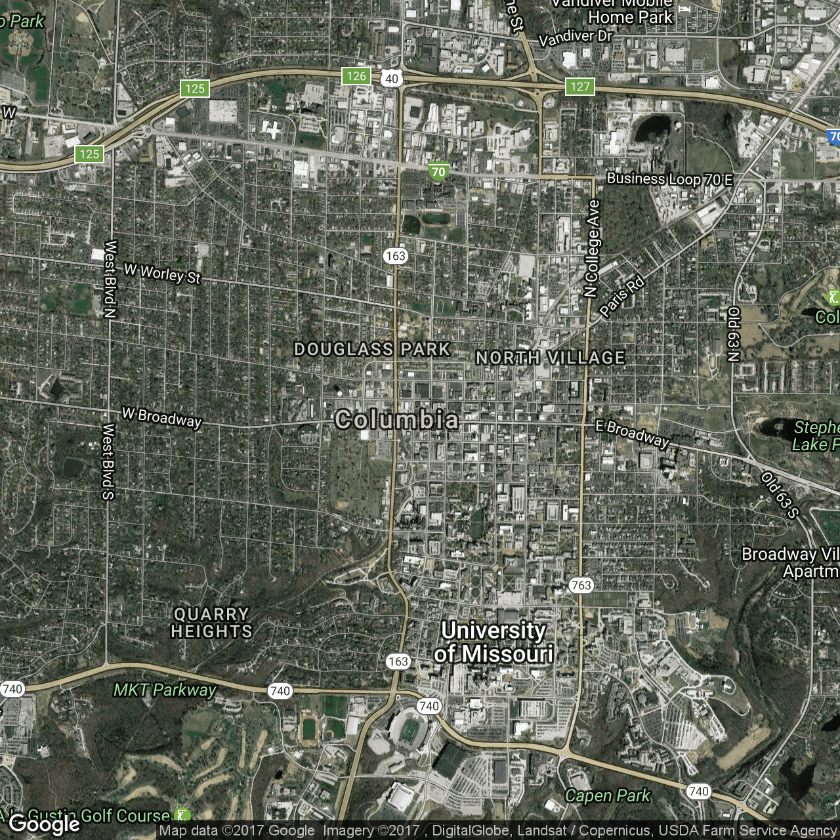

In [6]:
qmap('65201', zoom = 14, maptype = 'hybrid')

**get_map** is function to grab map images from many online sources including Google Maps. If we want to specifically use Google Maps, then we will use GetMap() function of RgoogleMaps library. 

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=houston,+texas&zoom=10&size=640x640&scale=2&maptype=terrain&language=en-EN&sensor=false
Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=houston,%20texas&sensor=false
Warning message:
“`panel.margin` is deprecated. Please use `panel.spacing` property instead”

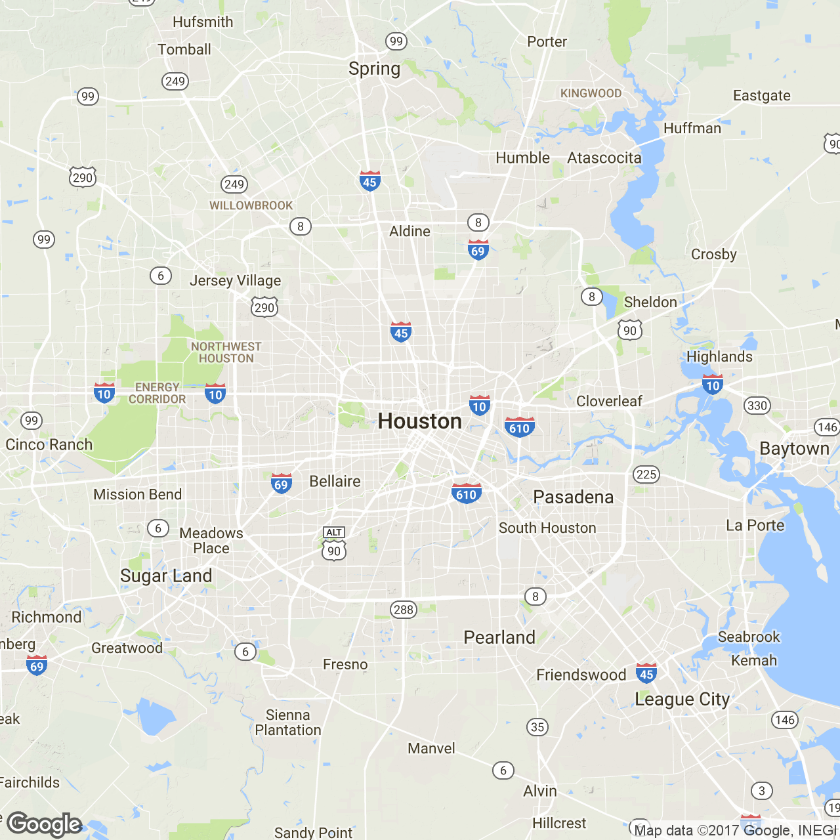

In [7]:
# Let's get a map of Houston
hdf <- get_map("houston, texas")
# and display it 
ggmap(hdf, extent = "device")

Using zoom = 11...
Map from URL : http://tile.stamen.com/toner-lite/11/479/846.png
Map from URL : http://tile.stamen.com/toner-lite/11/480/846.png
Map from URL : http://tile.stamen.com/toner-lite/11/481/846.png
Map from URL : http://tile.stamen.com/toner-lite/11/482/846.png
Map from URL : http://tile.stamen.com/toner-lite/11/479/847.png
Map from URL : http://tile.stamen.com/toner-lite/11/480/847.png
Map from URL : http://tile.stamen.com/toner-lite/11/481/847.png
Map from URL : http://tile.stamen.com/toner-lite/11/482/847.png
Map from URL : http://tile.stamen.com/toner-lite/11/479/848.png
Map from URL : http://tile.stamen.com/toner-lite/11/480/848.png
Map from URL : http://tile.stamen.com/toner-lite/11/481/848.png
Map from URL : http://tile.stamen.com/toner-lite/11/482/848.png
Warning message:
“`panel.margin` is deprecated. Please use `panel.spacing` property instead”

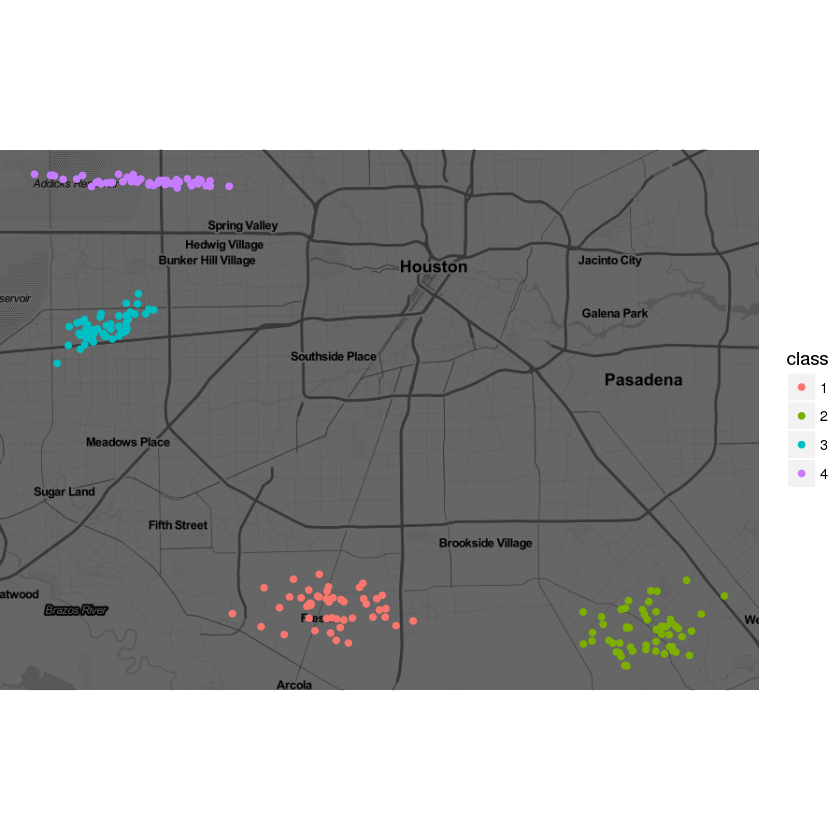

In [8]:
# Let's make some fake spatial data to show how to display it on the map 
mu <- c(-95.3632715, 29.7632836); nDataSets <- sample(4:10,1)
chkpts <- NULL
for(k in 1:nDataSets){
 a <- rnorm(2); b <- rnorm(2);
 si <- 1/3000 * (outer(a,a) + outer(b,b))
 chkpts <- rbind(chkpts,cbind(MASS::mvrnorm(rpois(1,50), jitter(mu, .01), si), k))
}

chkpts <- data.frame(chkpts)
names(chkpts) <- c("lon", "lat","class")
chkpts$class <- factor(chkpts$class)

# qmplot is easier to use in this case: it'l collect the map from an online resource
qmplot(lon, lat, data = chkpts, color = class, darken = .6)

Using zoom = 11...
Warning message:
“`panel.margin` is deprecated. Please use `panel.spacing` property instead”

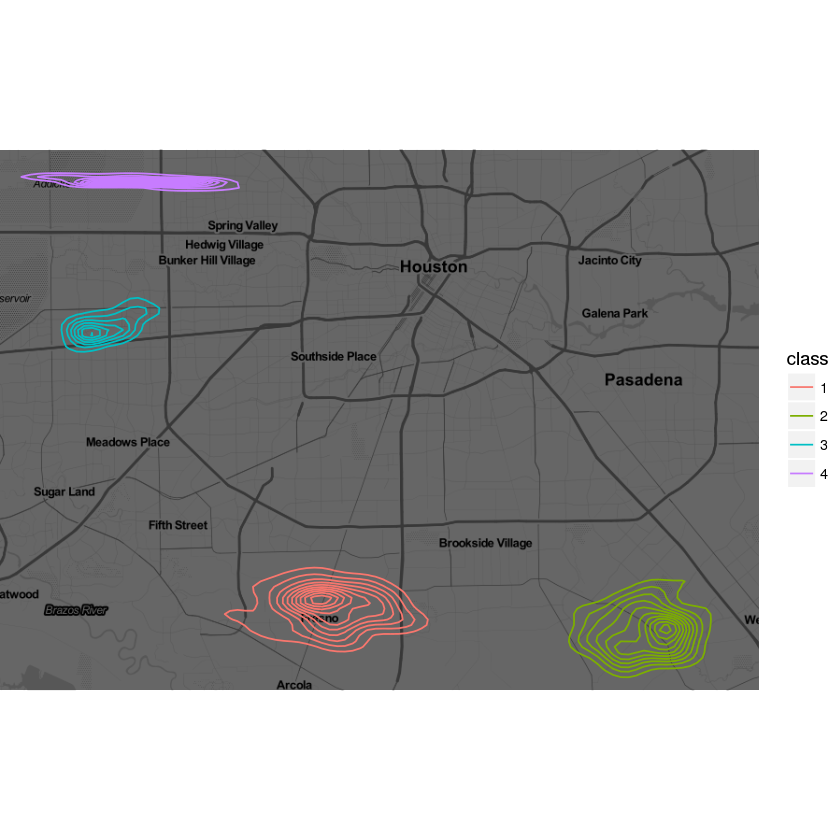

In [9]:

# Let's create a density plot:
qmplot(lon, lat, data = chkpts, geom = "density2d", color = class, darken = .6)

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=29.763284,-95.363271&zoom=10&size=640x640&scale=2&maptype=satellite&language=en-EN&sensor=false
Warning message:
“`panel.margin` is deprecated. Please use `panel.spacing` property instead”

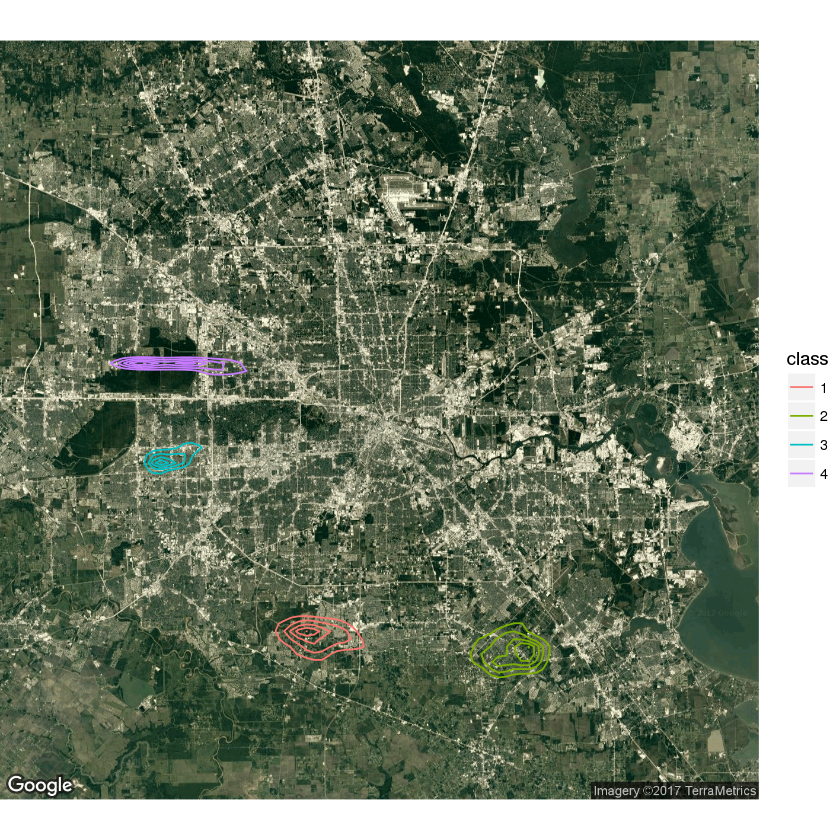

In [10]:
# or overlay it on a satellite image with ggplot 
ggmap(get_map(maptype = "satellite"), extent = "device") +
stat_density2d(aes(x = lon, y = lat, colour = class), data = chkpts, bins = 5)

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=29.763284,-95.363271&zoom=8&size=640x640&scale=2&maptype=satellite&language=en-EN&sensor=false
Warning message:
“`panel.margin` is deprecated. Please use `panel.spacing` property instead”

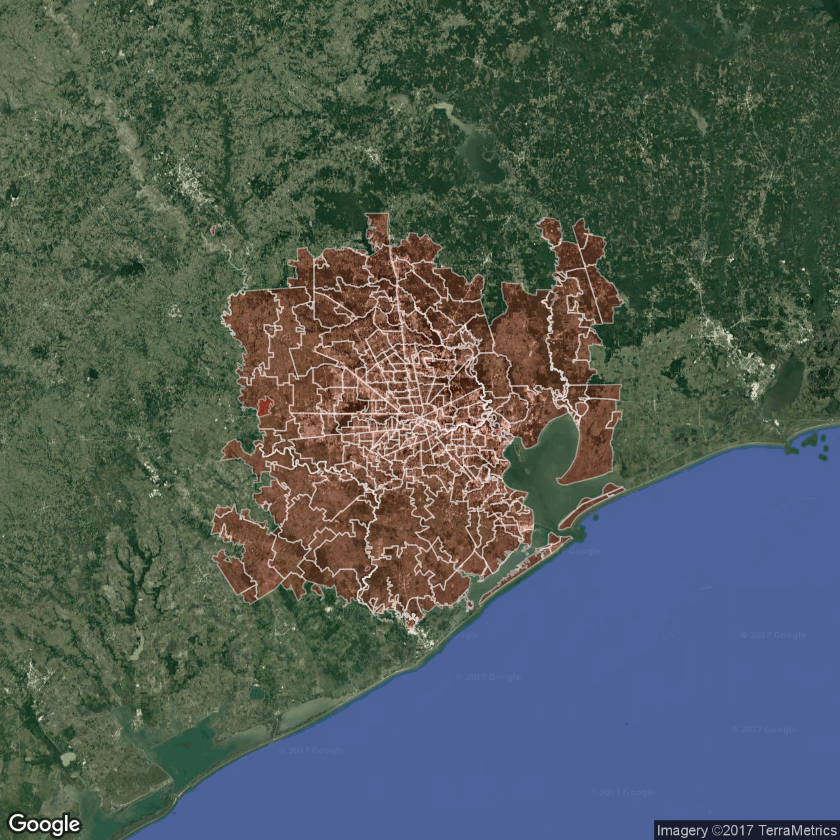

In [11]:
# We can also create a shapefile like layers on satellite image
data(zips)
ggmap(get_map(maptype = "satellite", zoom = 8), extent = "device") +
geom_polygon(aes(x = lon, y = lat, group = plotOrder), data = zips, colour = NA, fill = "red", alpha = .2) +
geom_path(aes(x = lon, y = lat, group = plotOrder), data = zips, colour = "white", alpha = .4, size = .4)

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=houston&zoom=14&size=640x640&scale=2&maptype=terrain&language=en-EN&sensor=false
Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=houston&sensor=false
Warning message:
“`panel.margin` is deprecated. Please use `panel.spacing` property instead”Warning message:
“Using size for a discrete variable is not advised.”Warning message:
“Removed 11 rows containing missing values (geom_point).”

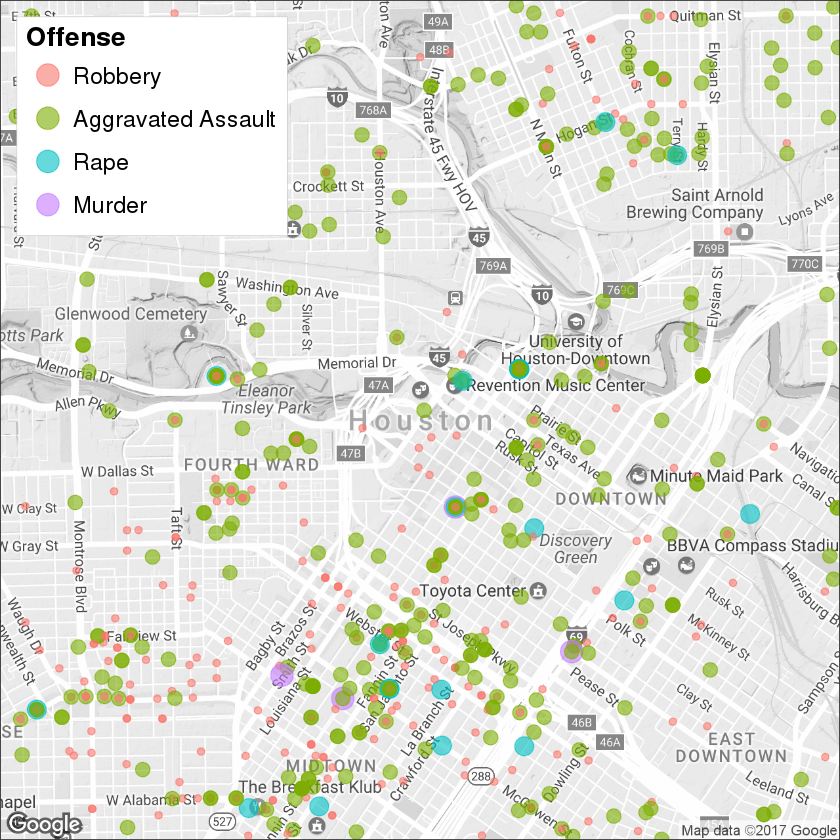

In [12]:
## Let's do a crime plot on downtown Houston 

# pick only violent crimes
violent_crimes <- subset(crime,offense != "auto theft" & offense != "theft" & offense != "burglary")
# rank violent crimes
violent_crimes$offense <- factor(violent_crimes$offense, levels = c("robbery", "aggravated assault","rape", "murder"))

# restrict to downtown
violent_crimes <- subset(violent_crimes, -95.39681 <= lon & lon <= -95.34188 & 29.73631 <= lat & lat <= 29.78400)

# get map and bounding box
theme_set(theme_bw(16))

HoustonMap <- ggmap(get_map("houston", zoom = 14, color = "bw"),extent = "device", legend = "topleft")

# the bubble chart
HoustonMap +
geom_point(aes(x = lon, y = lat, colour = offense, size = offense), data = violent_crimes, alpha=0.6) +
scale_colour_discrete("Offense", labels = c("Robbery","Aggravated Assault","Rape","Murder")) +
scale_size_discrete("Offense", labels = c("Robbery","Aggravated Assault","Rape","Murder"), range = c(1.75,6)) +
guides(size = guide_legend(override.aes = list(size = 6))) +
theme(
   legend.key.size = grid::unit(1.8,"lines"),
   legend.title = element_text(size = 16, face = "bold"),
   legend.text = element_text(size = 14)
   ) +
labs(colour = "Offense", size = "Offense")

Using zoom = 14...
Map from URL : http://tile.stamen.com/toner-lite/14/3850/6770.png
Map from URL : http://tile.stamen.com/toner-lite/14/3851/6770.png
Map from URL : http://tile.stamen.com/toner-lite/14/3852/6770.png
Map from URL : http://tile.stamen.com/toner-lite/14/3853/6770.png
Map from URL : http://tile.stamen.com/toner-lite/14/3850/6771.png
Map from URL : http://tile.stamen.com/toner-lite/14/3851/6771.png
Map from URL : http://tile.stamen.com/toner-lite/14/3852/6771.png
Map from URL : http://tile.stamen.com/toner-lite/14/3853/6771.png
Map from URL : http://tile.stamen.com/toner-lite/14/3850/6772.png
Map from URL : http://tile.stamen.com/toner-lite/14/3851/6772.png
Map from URL : http://tile.stamen.com/toner-lite/14/3852/6772.png
Map from URL : http://tile.stamen.com/toner-lite/14/3853/6772.png
Map from URL : http://tile.stamen.com/toner-lite/14/3850/6773.png
Map from URL : http://tile.stamen.com/toner-lite/14/3851/6773.png
Map from URL : http://tile.stamen.com/toner-lite/14/3852/

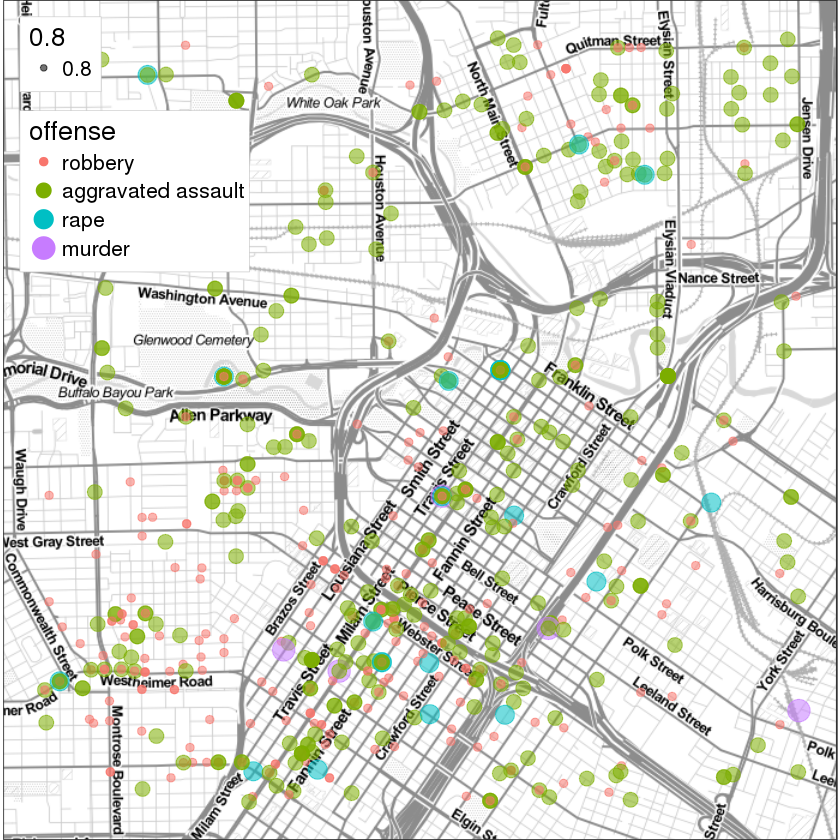

In [13]:
# doing it with qmplot is even easier - let's use a toner friendly map 
qmplot(lon, lat, data = violent_crimes, maptype = "toner-lite", color = offense, alpha = 0.8, size = offense, legend = "topleft")


Warning message:
“Removed 11 rows containing non-finite values (stat_density2d).”

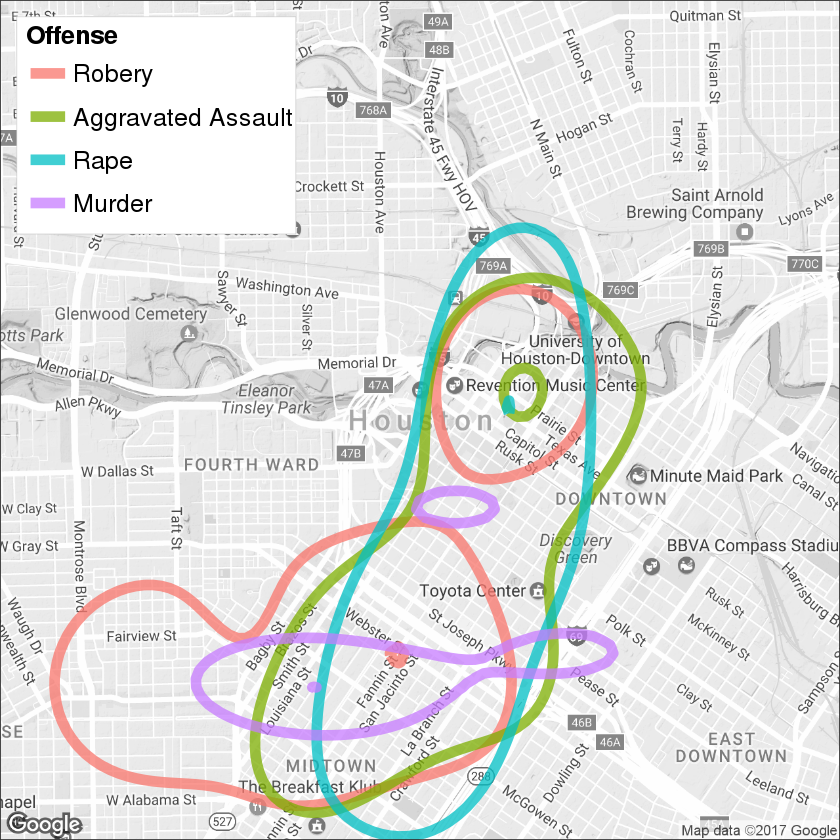

In [14]:
# Let's do a contour plot
HoustonMap +
stat_density2d(aes(x = lon, y = lat, colour = offense),
size = 3, bins = 2, alpha = 3/4, data = violent_crimes) +
scale_colour_discrete("Offense", labels = c("Robery","Aggravated Assault","Rape","Murder")) +
theme(
   legend.text = element_text(size = 15, vjust = .5),
   legend.title = element_text(size = 15,face="bold"),
   legend.key.size = grid::unit(1.8,"lines")
)

Warning message:
“Removed 11 rows containing non-finite values (stat_bin2d).”Warning message:
“Removed 8 rows containing missing values (geom_tile).”

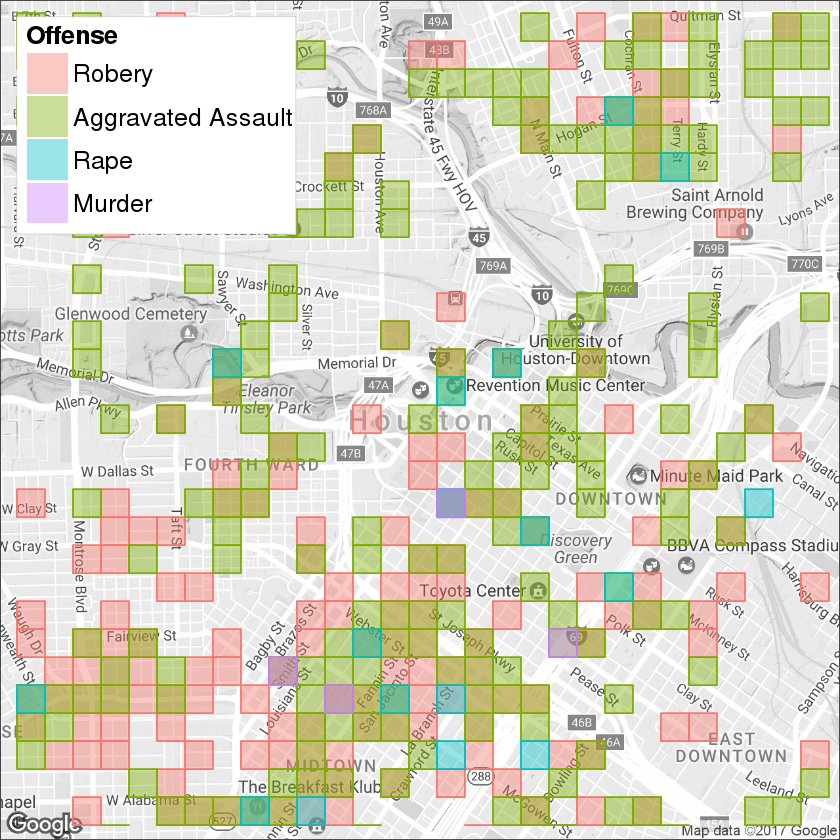

In [15]:
# and a 2d histogram...
HoustonMap +
stat_bin2d(aes(x = lon, y = lat, colour = offense, fill = offense), size = .5, bins = 30, alpha = 0.4, data = violent_crimes) +
scale_colour_discrete("Offense",labels = c("Robery","Aggravated Assault","Rape","Murder"),guide = FALSE) +
scale_fill_discrete("Offense", labels = c("Robery","Aggravated Assault","Rape","Murder")) +
theme(
   legend.text = element_text(size = 15, vjust = .5),
   legend.title = element_text(size = 15,face="bold"),
   legend.key.size = grid::unit(1.8,"lines")
)

You may notice all the messages produced by different map servers get_map() is getting data from. To suppress them, you can use the suppressMessages() function. Let's do a crime density visualization.

Warning message:
“`panel.margin` is deprecated. Please use `panel.spacing` property instead”Warning message:
“Removed 11 rows containing non-finite values (stat_density2d).”

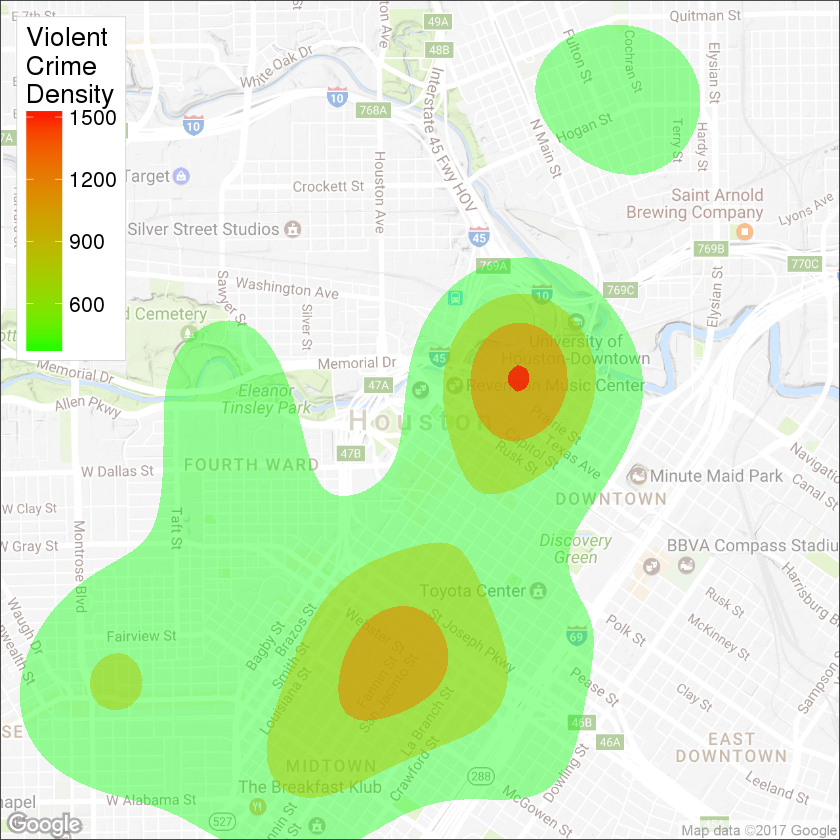

In [16]:
# Let's get a color map and do a density plot with stat_density2d
houston <- suppressMessages(get_map("houston", zoom = 14))
HoustonMap <- ggmap(houston, extent = "device", legend = "topleft", darken = c(.5,"white")) # this whitens the map 

HoustonMap +
stat_density2d(aes(x = lon, y = lat, fill = ..level.., alpha = ..level..),size = 2, bins = 4, data = violent_crimes, geom = "polygon") +
scale_fill_gradient("Violent\nCrime\nDensity",low = "green", high = "red") + 
scale_alpha(range = c(0.4, 0.7), guide = FALSE) +
guides(fill = guide_colorbar(barwidth = 1.5, barheight = 10))


Warning message:
“Removed 11 rows containing non-finite values (stat_density2d).”Warning message:
“Removed 11 rows containing non-finite values (stat_density2d).”

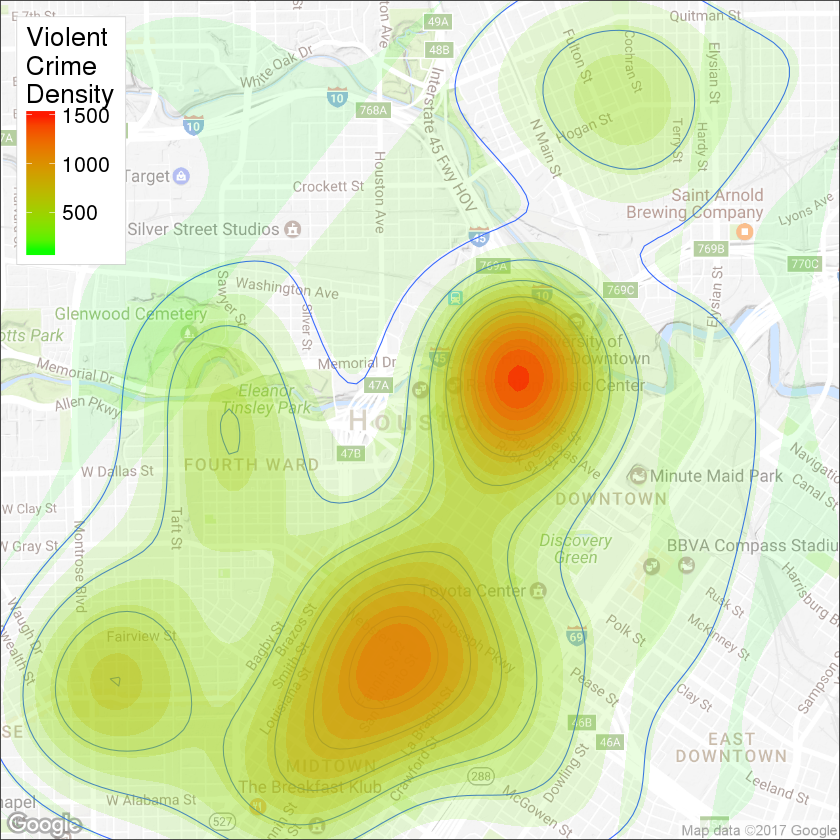

In [17]:
# Let's do a finer plot with 16 bins and add boundaries too
HoustonMap +
geom_density2d(data = violent_crimes, aes(x = lon, y = lat), size = 0.3) + 
stat_density2d(data = violent_crimes, aes(x = lon, y = lat, fill = ..level.., alpha = ..level..), size = 0.01, bins = 16, geom = "polygon") + 
scale_fill_gradient("Violent\nCrime\nDensity",low = "green", high = "red") + 
scale_alpha(range = c(0.1, 0.4), guide = FALSE)

RgoogleMaps library also has its own functions to visualize maps and data. 

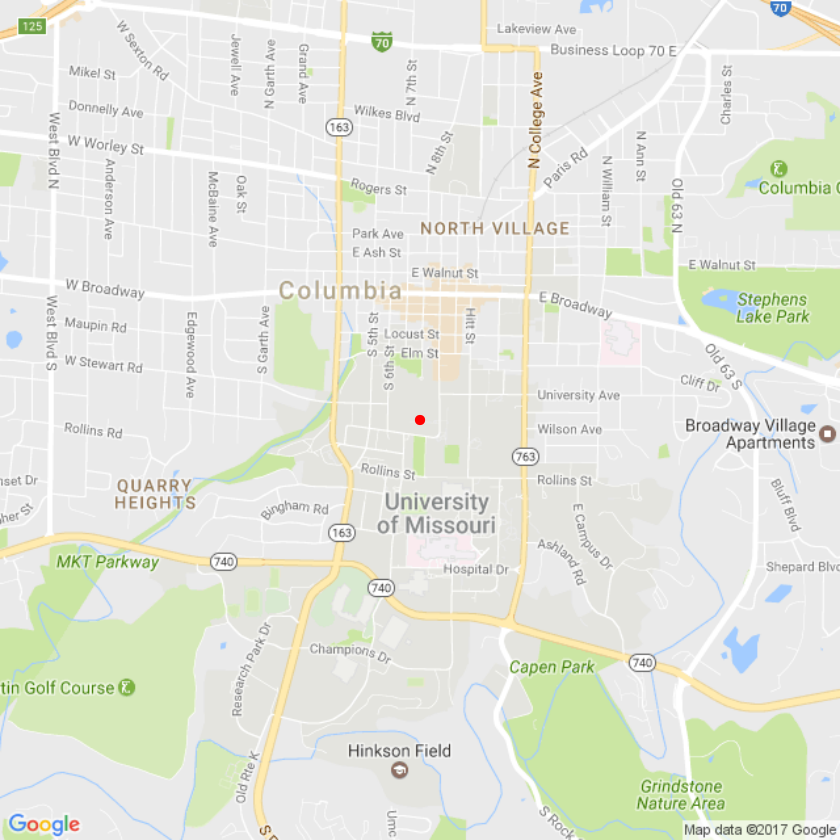

In [18]:
# This is how to obtain a map image using RgoogleMaps library 

# Jesse Hall coordinates
lat = c(38.945092);
lon = c(-92.328806);
center = c(mean(lat), mean(lon));

Map <- GetMap(center=center, zoom=14);

PlotOnStaticMap(Map, lat = lat, lon = lon, cex=1.5,pch=20, col=c('red'), add=FALSE);


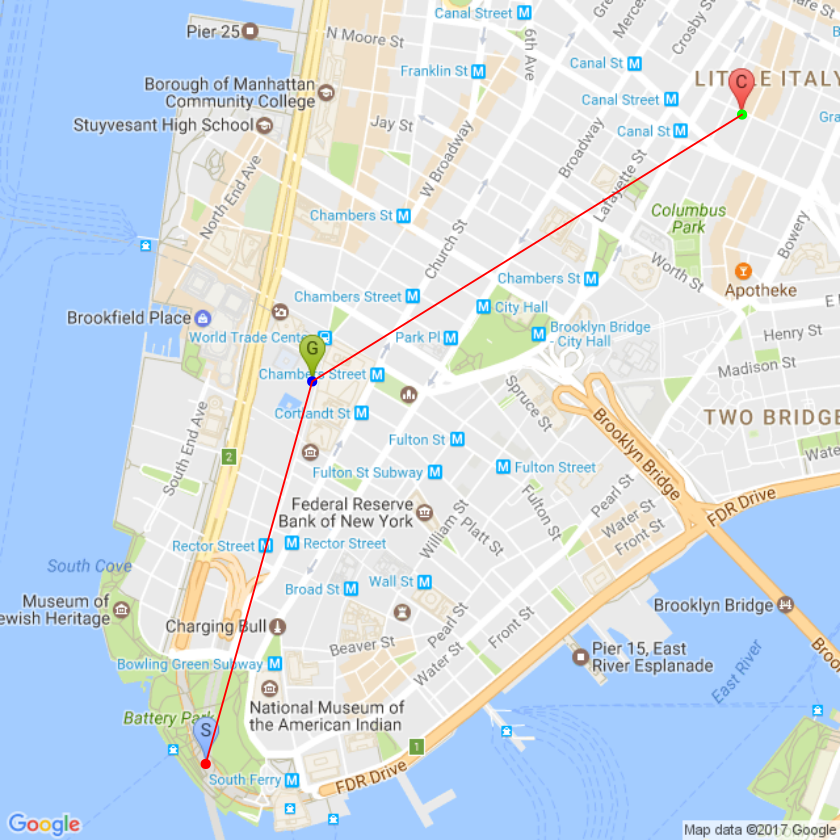

In [19]:
# This is an example of how to find the center and zoom from the geo data, 
# and how to add Google-style markers to the map 
lat = c(40.702147,40.711614,40.718217);
lon = c(-74.015794,-74.012318,-73.998284);
center = c(mean(lat), mean(lon));
zoom <- min(MaxZoom(range(lat), range(lon)));

MyMap <- GetMap(center=center, zoom=zoom,markers = paste0("&markers=color:blue|label:S|",
           "40.702147,-74.015794&markers=color:green|label:G|40.711614,-74.012318&markers=",
           "color:red|color:red|label:C|40.718217,-73.998284"), destfile = "MyTile1.png");

PlotOnStaticMap(MyMap, lat = lat, 
                       lon = lon, 
                       destfile = "MyTile1.png", cex=1.5,pch=20,
                       col=c('red', 'blue', 'green'), add=FALSE);

#and add lines:
PlotOnStaticMap(MyMap, lat = c(40.702147,40.711614,40.718217), 
                       lon = c(-74.015794,-74.012318,-73.998284), 
                       lwd=1.5,col=c('red', 'blue', 'green'), FUN = lines, add=TRUE)


censustract.FIPS,cases,population
36007000100,3.08284,3540
36007000200,4.08331,3560
36007000300,1.08750,3739
36007000400,1.06515,2784
36007000500,3.06017,2571
36007000600,1.06386,2729


censustract.FIPS,x,y
36007000100,-75.94087,42.10782
36007000200,-75.93118,42.11099
36007000300,-75.92011,42.11738
36007000400,-75.89749,42.11801
36007000500,-75.90269,42.10872
36007000600,-75.88943,42.11400


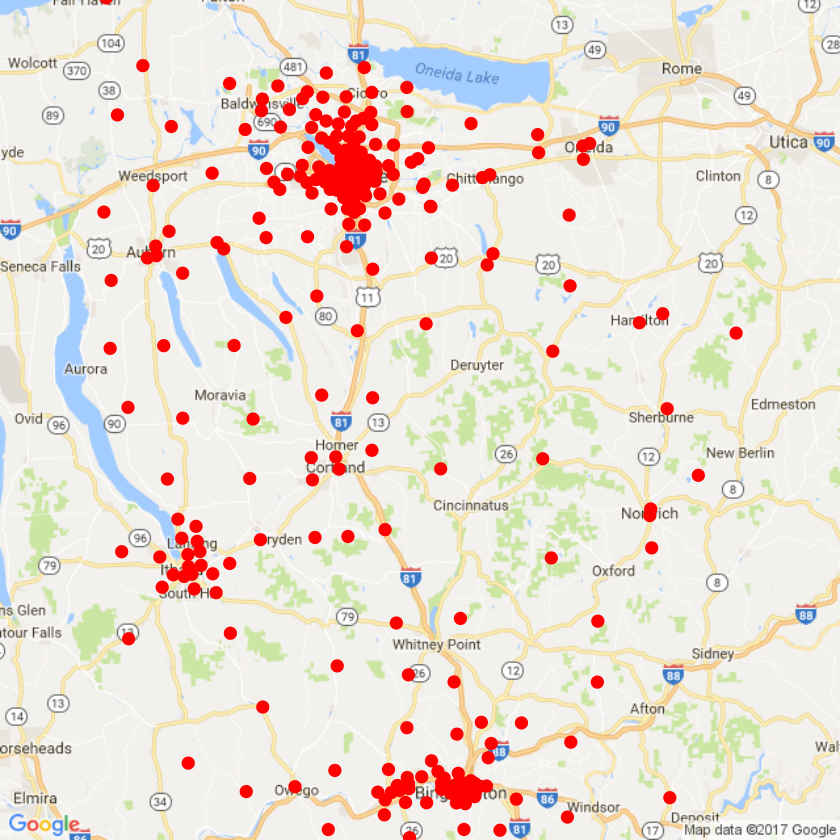

In [20]:
# This data set comes with the RgoogleMaps library 
data("NYleukemia")

# Let's visualize the locations of cases using RgoogleMaps functions
head(NYleukemia$data)
population <- NYleukemia$data$population
cases <- NYleukemia$data$cases

geo <- NYleukemia$geo
head(geo)
lats <-geo$y
lons <-geo$x

mapNY <- GetMap(center=c(lat=42.67456,lon=-76.00365), destfile = "NYstate.png", maptype = "street", zoom=9)
PlotOnStaticMap(mapNY, lat = lats, lon = lons, cex=2, pch=20, col="red", add=FALSE);

In [21]:
# Let's do it properly in ggplot

NY <- suppressMessages(get_map("homer, new york", zoom = 9))
NYmap <- ggmap(NY, extent = "device", legend = "topleft", darken = c(.5,"white"))

NYdf <- data.frame(population, cases, lats, lons)
head(NYdf)

Warning message:
“`panel.margin` is deprecated. Please use `panel.spacing` property instead”

population,cases,lats,lons
3540,3.08284,42.10782,-75.94087
3560,4.08331,42.11099,-75.93118
3739,1.08750,42.11738,-75.92011
2784,1.06515,42.11801,-75.89749
2571,3.06017,42.10872,-75.90269
2729,1.06386,42.11400,-75.88943


Warning message:
“Removed 1 rows containing missing values (geom_point).”

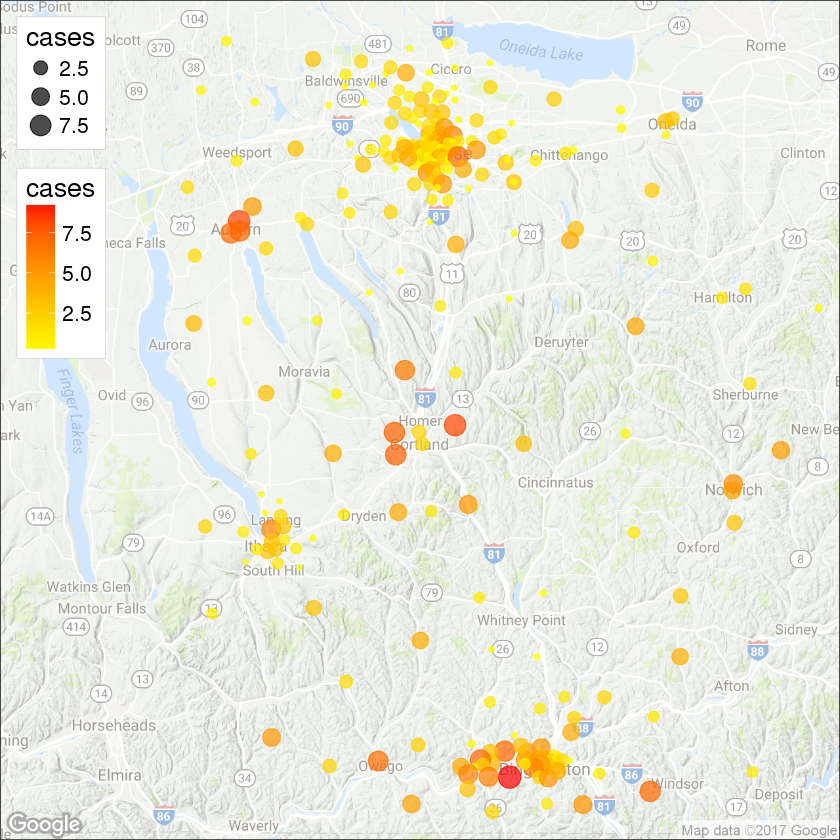

In [22]:
NYmap + 
geom_point(data=NYdf, aes(x = lons, y = lats, color = cases, size = cases), alpha=0.7) + 
scale_color_gradient(low = "yellow", high = "red") + 
scale_alpha(range = c(0.1, 0.4), guide = FALSE)